In [1]:
import os
import sys

current_working_directory = os.getcwd()
project_directory = os.path.dirname(os.path.dirname(current_working_directory))
utils_path = os.path.join(project_directory, 'utils')
plotting_path = os.path.join(project_directory, 'plotting_templates')
if utils_path not in sys.path:
    sys.path.append(utils_path)

In [2]:
import jax
jax.config.update("jax_enable_x64", True) # Enable 64-bit double precision

# Imports
import jax.numpy as jnp
from jax import random
import matplotlib.pyplot as plt
from tqdm import tqdm

# Utilities
from utils_DST import *
from utils_elliptic_dst_2d import create_interior
from utils_error import compute_2d_error
from jax import jit, grad, vmap, hessian, value_and_grad
import optax

In [3]:
plt.style.use(plotting_path + '/plot_style-Examples_3d.txt')
width = 4
height = width * 3 / 4

In [4]:
# Define the neural network
def init_params(layer_sizes, key):
    params = []
    keys = random.split(key, len(layer_sizes))
    for m, n, key in zip(layer_sizes[:-1], layer_sizes[1:], keys):
        weights = random.normal(key, (m, n)) * jnp.sqrt(2 / m)
        biases = jnp.zeros(n)
        params.append((weights, biases))
    return params
# Draw random samples for the Random feature embedding part
n_samples = 32
print('Number of samples: ', n_samples)
d_in = 2
sigma_rff = 5.0
random_features = random.normal(random.PRNGKey(123),  shape = (n_samples, d_in))*sigma_rff
def feature_map(x, random_features):
    outputs = jnp.dot(random_features, x)
    return jnp.hstack([jnp.cos(outputs), jnp.sin(outputs)])

def predict(params, x):
    activations = feature_map(x, random_features)
    for weights, biases in params[:-1]:
        activations = jnp.tanh(jnp.dot(activations, weights) + biases)
    final_weights, final_biases = params[-1]
    return jnp.squeeze(jnp.dot(activations, final_weights) + final_biases)


Number of samples:  32


In [5]:
def count_parameters(params):
    total_params = 0
    for weights, biases in params:
        total_params += weights.size
        total_params += biases.size
    return total_params

# Semilinear example


We will consider the problem 

\begin{aligned}
 -\nu \Delta u + bu+c \sin(\beta 2\pi u) &= \xi \quad x \in \Omega\\
u &= 0 \quad x \in \partial \Omega
\end{aligned}

with a manufactured solution 


\begin{aligned}
u = \sum_{k=1}^\infty\sum_{l=1}^\infty \frac{u_{kl}}{(k^2 + l^2)^{\alpha + \delta}} \sin(\pi k x) \sin(\pi l y) \quad  u_{kl} \sim \mathcal{N}(0, 1)
\end{aligned}



In [6]:
lower = 0.0
upper = 1.0
domain = jnp.array([lower,upper])

In [7]:
key = random.PRNGKey(647023)

c = 1.0
beta = 0.5

n_coef = 2**10
print("Number of coefficients: ", n_coef)

nu = 1e-1
b = jit(lambda x, y:1)#jit(lambda x, y: jnp.cos(5*jnp.pi*(x**2 + y**4)) + x**2 + jnp.exp(-y**2)+ 1.5)
vmap_b = jit(vmap(vmap(b, in_axes = (None, 0)), in_axes = (0, None)))


x_finest = jnp.linspace(lower,upper,n_coef +1, endpoint=False)[1:] # make sure to exclude the points 0 and 1!
y_finest = jnp.linspace(lower,upper,n_coef +1, endpoint=False)[1:]
X, Y = jnp.meshgrid(x_finest, y_finest)
A, B = jnp.meshgrid(x_finest, y_finest, indexing='ij')
interior_finest = jnp.stack((A, B), axis=-1).reshape(-1, 2)



frequencies = jnp.arange(0, n_coef) + 1

delta = 0.0
alpha = 1.0
random_draw =  random.normal(key, shape= (n_coef,n_coef))


decay = (jnp.arange(1,n_coef + 1)[None]**2 + jnp.arange(1,n_coef+1)[:,None]**2)
coef_u =random_draw*(decay)**(-alpha -delta)
coef_laplacian =coef_u*((nu*jnp.pi**2*decay))

tau = jit(lambda x: c*jnp.sin(beta*2*jnp.pi*x))
tau_prime = jit(lambda x: c*jnp.cos(beta*2*jnp.pi*x)*beta*2*jnp.pi)

u_values = dst_2d(coef_u)
f_values = dst_2d(coef_laplacian) + vmap_b(x_finest, y_finest)*u_values + tau(u_values)
coef_f = compute_sine_coef_2d(f_values)

Number of coefficients:  1024


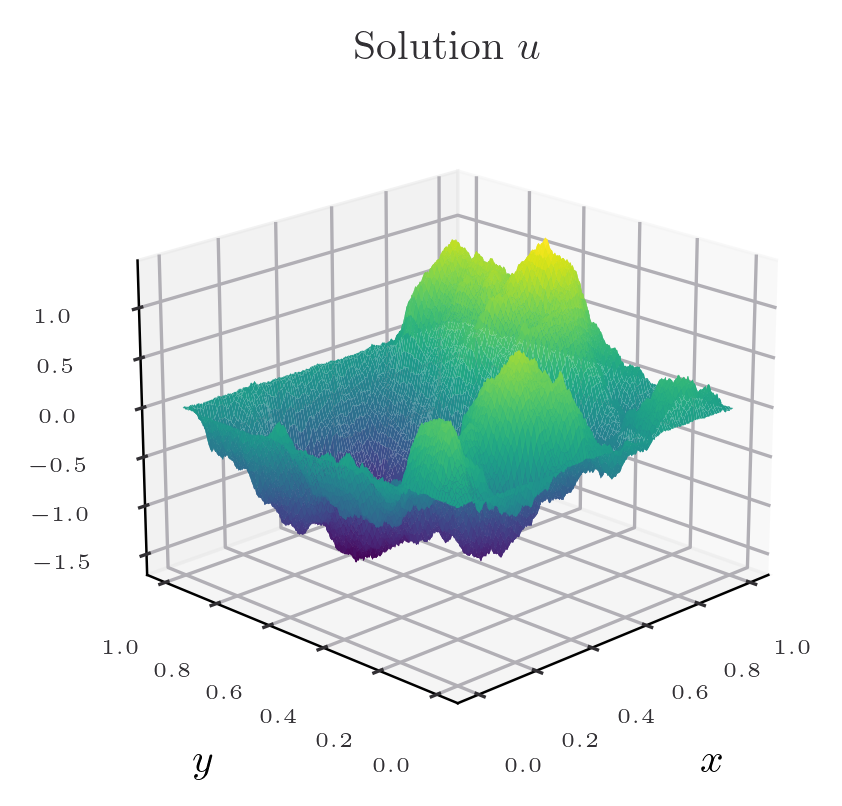

In [8]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

stride = 10
ax.plot_surface(X, Y, u_values,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Solution $u$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

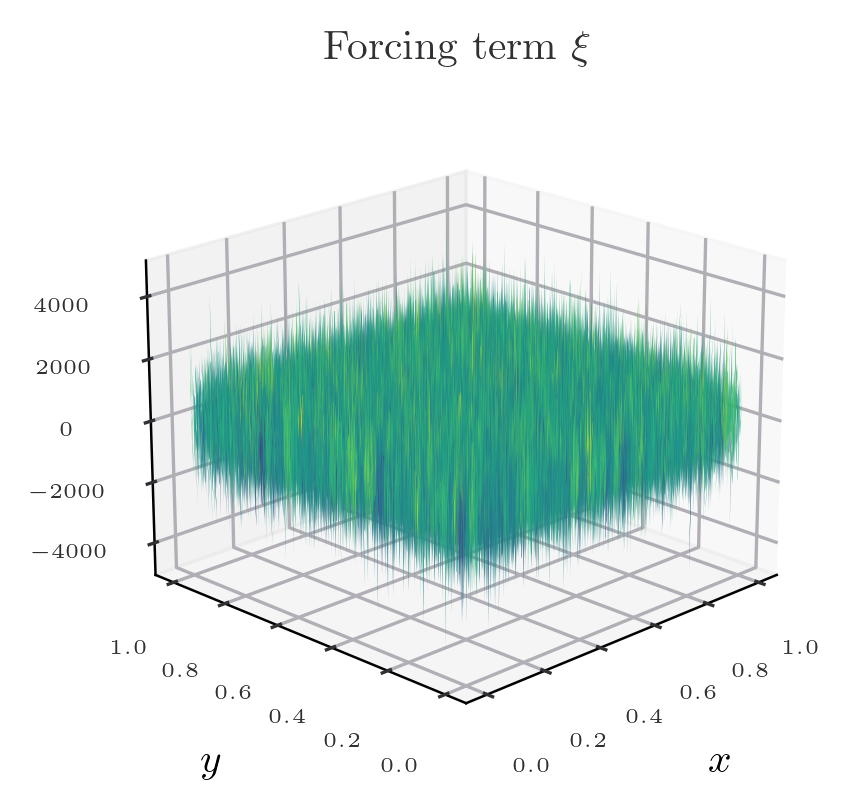

In [9]:
# Create a figure with two 3D subplots
fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

ax.plot_surface(X, Y, f_values,  cmap='viridis', rstride=stride, cstride=stride)
ax.set_title(r"Forcing term $\xi$")
ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$y$')
plt.show()

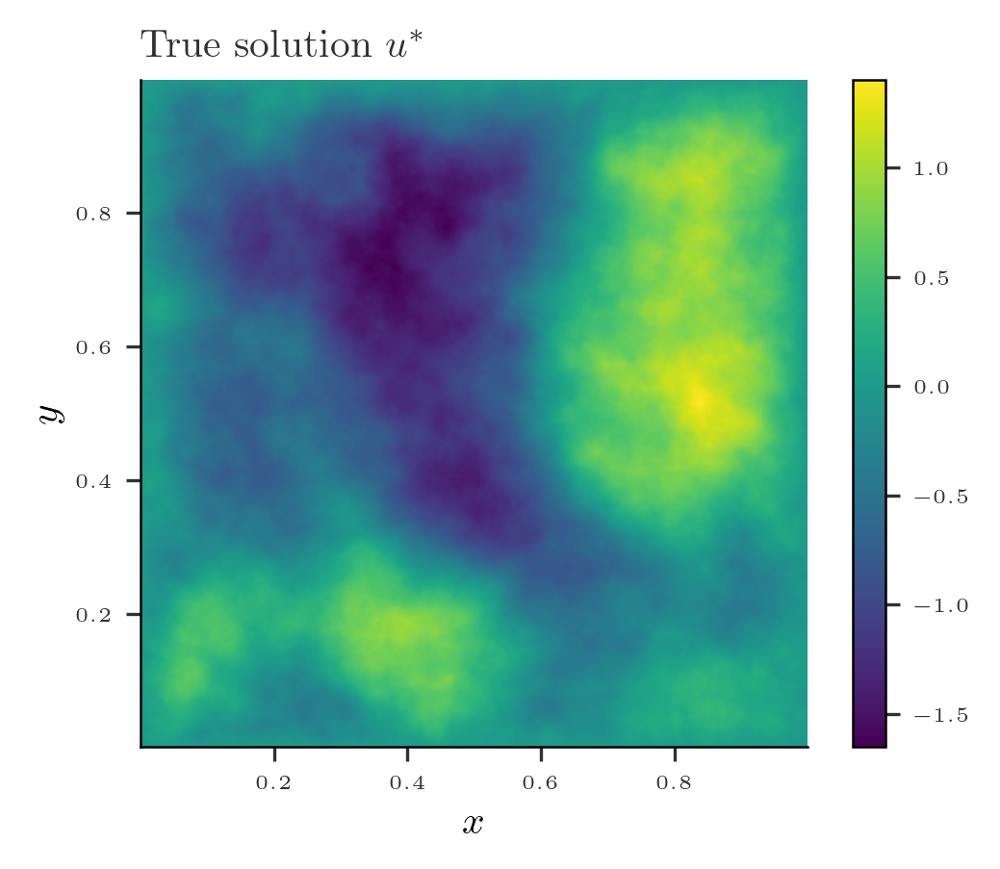

In [10]:
fig = plt.figure(figsize=(width, height))

plt.imshow(u_values[::-1, :], cmap='viridis', extent=[x_finest.min(), x_finest.max(), y_finest.min(), y_finest.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'True solution $u^*$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

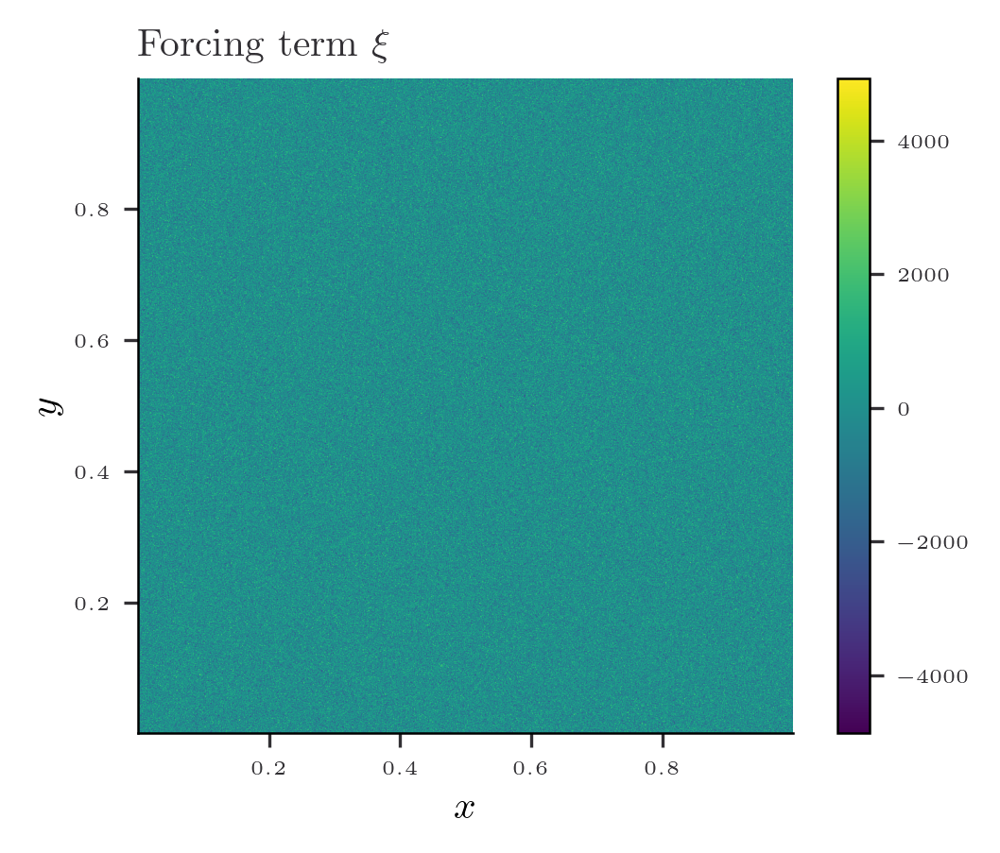

In [11]:
fig = plt.figure(figsize=(width, height))

plt.imshow(f_values[::-1, :], cmap='viridis', extent=[x_finest.min(), x_finest.max(), y_finest.min(), y_finest.max()])

# Set the axis labels (optional)
plt.xlabel(r'$x$')
plt.ylabel(r'$y$')
plt.title(r'Forcing term $\xi$')

# Display the plot
plt.colorbar()  # Add a colorbar for reference
plt.show()

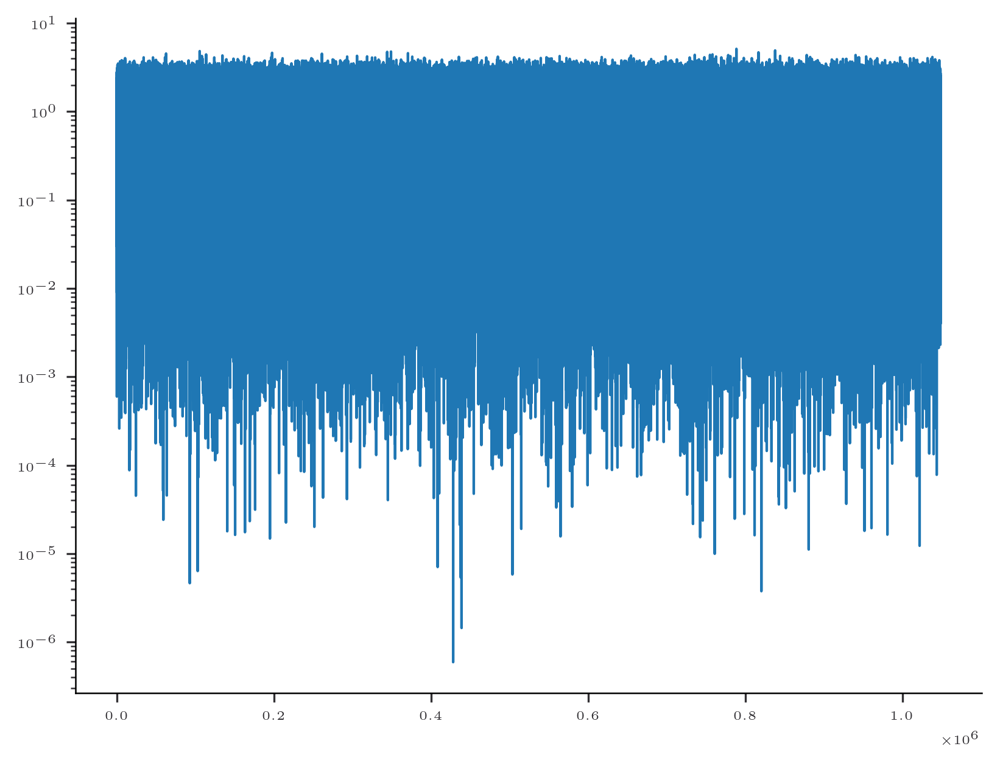

In [12]:
plt.plot(jnp.abs(coef_f.reshape(-1)), label = "f")
plt.yscale("log")
plt.show()

In [13]:
# 2d grid 
n_points = 2**6
print("Number of points {} ({} measurements)".format(n_points, n_points**2))
x = jnp.linspace(lower, upper, n_points + 1, endpoint=False)[1:] # remember to not include the points 0 and 1
y = jnp.linspace(lower, upper, n_points + 1, endpoint=False)[1:]
X, Y = jnp.meshgrid(x, y)

# Use meshgrid to create the grid of pairs
A, B = jnp.meshgrid(x, x, indexing='ij')

# Combine A and B into pairs
interior = jnp.stack((A, B), axis=-1).reshape(-1, 2)

# Create the boundary
# Boundary points
boundary = jnp.hstack([jnp.zeros(1), x, jnp.zeros(1)])
n_boundary = boundary.shape[0]
print("Number of boundary points: {} ({} total)".format(n_boundary, n_boundary*4))

boundary_points = []
# Creat a discretization of the boundary
for i in [0,1]:
    boundary_points.append(jnp.stack([jnp.zeros(n_boundary) + i, boundary], axis=-1))
for i in [0,1]:
    boundary_points.append(jnp.stack([boundary, jnp.zeros(n_boundary) + i], axis=-1))
boundary_points = jnp.concatenate(boundary_points, axis=0)
boundary_condition = jnp.zeros(shape = boundary_points.shape[0])

n_eval = 2**8
x_eval = jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:] #jnp.hstack([jnp.zeros(1),jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:], jnp.zeros(1)])
y_eval = jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:] #jnp.hstack([jnp.zeros(1),jnp.linspace(lower, upper, n_eval + 1, endpoint=False)[1:], jnp.zeros(1)])
X, Y = jnp.meshgrid(x_eval, y_eval)

interior_eval = create_interior(x_eval, y_eval)

ratio = int(n_coef/n_eval)
u_eval = u_values[::ratio, ::ratio]

Number of points 64 (4096 measurements)


Number of boundary points: 66 (264 total)


## Computing a solution using a negative Sobolev norm $H^{-1}$ loss 

In [14]:
s_values = [0.0, 0.5, 1.0, 1.1, 2.0]
errors = []
errors_rel = [] 
predictions = []
f_observed =  coef_f[:n_points,:n_points]

In [15]:
neural_network = jit(vmap(predict, in_axes=(None, 0)))
def laplacian(params, x):
    return jnp.trace(hessian(predict, argnums=-1)(params, x))
nn_laplacian = jit(vmap(laplacian, in_axes = (None, 0)))

# Define the loss function
def loss_fn(params, grid, boundary, f, boundary_conditions, nu, n_points, decay_nugget, w = 1.0):
    u_grid = neural_network(params, grid).reshape(n_points, n_points)
    non_linearity = tau(u_grid)
    laplacian_grid = nn_laplacian(params, grid).reshape(n_points, n_points)
    # Compute the sine transform
    pred_sine = compute_sine_coef_2d(-nu*laplacian_grid + vmap_b(x,y)*u_grid+ non_linearity)
    residual_interior = (pred_sine - f)*decay_nugget

    pred_boundary = neural_network(params, boundary)
    residual_boundary = pred_boundary - boundary_conditions
    return w*jnp.mean(residual_interior**2) + jnp.mean(residual_boundary**2)

layer_sizes = [n_samples*2, 64, 64,  1]

In [18]:
def train(s, verbose = True):
    decay_nugget = (jnp.arange(1,n_points + 1)[None]**2 + jnp.arange(1,n_points+1)[:,None]**2)**(-s/2)
    key = random.PRNGKey(0)
    params = init_params(layer_sizes, key) # Initialize the parameters

    # Define the learning rate scheduler
    initial_learning_rate = 1e-3
    num_epochs = 1e5
    decay_steps = num_epochs/10
    decay_rate = 0.9

    learning_rate_schedule = optax.exponential_decay(
        init_value=initial_learning_rate,
        transition_steps=decay_steps,
        decay_rate=decay_rate,
        transition_begin=0,
        staircase=False
    )
    optimizer = optax.adam(learning_rate_schedule)
    opt_state = optimizer.init(params)

    @jit
    def train_step(params, opt_state):
        loss, grads = value_and_grad(loss_fn)(params, interior, boundary_points, f_observed, boundary_condition, nu, n_points, decay_nugget)
        updates, opt_state = optimizer.update(grads, opt_state, params)
        params = optax.apply_updates(params, updates)
        return params, opt_state, loss
    
    loss_hist = []
    for epoch in tqdm(range(int(num_epochs))):
        params, opt_state, loss = train_step(params, opt_state)
        if epoch % 1e4 == 0 and verbose:
            print(f'Epoch {epoch}, Loss: {loss:.7f}')
        loss_hist.append(loss)

        if epoch % decay_steps == 0 and verbose:
            current_learning_rate = learning_rate_schedule(epoch)
            print(f'Step {epoch}, Training Loss: {loss:.7f}, Learning Rate: {current_learning_rate:.6f}')
    return params, loss_hist


In [19]:
# This will take a while to run
loss_values= []
for s_decay in s_values:
    params, loss_hist = train(s_decay, verbose = False) # Plotting the loss history can also be interesting as it shows that misspecification of the decay can lead to poor convergence
    loss_values.append(loss_hist)
    pred_grid = neural_network(params, interior_eval).reshape(n_eval, n_eval)
    e, e_rel = compute_2d_error(pred_grid, u_eval, x_eval, y_eval)
    errors.append(e)
    errors_rel.append(e_rel)
    print("s = {}. L^2 error = {:.2e}. Relative L^2 error = {:.2e}".format(s_decay, e, e_rel))

  0%|          | 0/100000 [00:00<?, ?it/s]

100%|██████████| 100000/100000 [02:59<00:00, 557.64it/s]


s = 0.0. L^2 error = 3.47e-01. Relative L^2 error = 5.14e-01


100%|██████████| 100000/100000 [02:59<00:00, 555.89it/s]


s = 0.5. L^2 error = 2.93e-01. Relative L^2 error = 4.34e-01


100%|██████████| 100000/100000 [02:59<00:00, 557.28it/s]


s = 1.0. L^2 error = 7.87e-02. Relative L^2 error = 1.16e-01


100%|██████████| 100000/100000 [03:00<00:00, 552.69it/s]


s = 1.1. L^2 error = 3.13e-02. Relative L^2 error = 4.63e-02


100%|██████████| 100000/100000 [03:03<00:00, 546.25it/s]


s = 2.0. L^2 error = 5.52e-02. Relative L^2 error = 8.16e-02


## Create plots

In [ ]:
def create_plots(pred_grid,s):
    fig,ax = plt.subplots(1, 1, figsize=(width, height), subplot_kw={'projection': '3d'})

    stride = 2
    ax.plot_surface(X, Y, pred_grid,  cmap='viridis', rstride=stride, cstride=stride)
    ax.set_title(r"Predicted solution $u^\dagger$ with $s = {}$".format(s))
    ax.view_init(elev=20, azim=225)  # Adjust elevation and azimuthal angle as desired
    ax.set_xlabel(r'$x$')
    ax.set_ylabel(r'$y$')
    plt.show()

    fig = plt.figure(figsize=(width, height))
    plt.imshow(pred_grid, cmap='viridis', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

    # Set the axis labels (optional)
    plt.xlabel(r'$x$')
    plt.ylabel(r'$y$')
    plt.title(r'Predicted solution $u^\dagger$ with $s = {}$'.format(s))

    # Display the plot
    plt.colorbar()  # Add a colorbar for reference
    plt.show()

    fig = plt.figure(figsize=(width, height))

    plt.imshow(jnp.abs(pred_grid - u_eval), cmap='coolwarm', extent=[x_eval.min(), x_eval.max(), y_eval.min(), y_eval.max()])

    # Set the axis labels (optional)
    plt.xlabel(r'$x$')
    plt.ylabel(r'$y$')
    plt.title(r'Pointwise error $|u^\dagger - u^*|$ with $s = {}$'.format(s))

    # Display the plot
    plt.colorbar()  # Add a colorbar for reference
    plt.show()


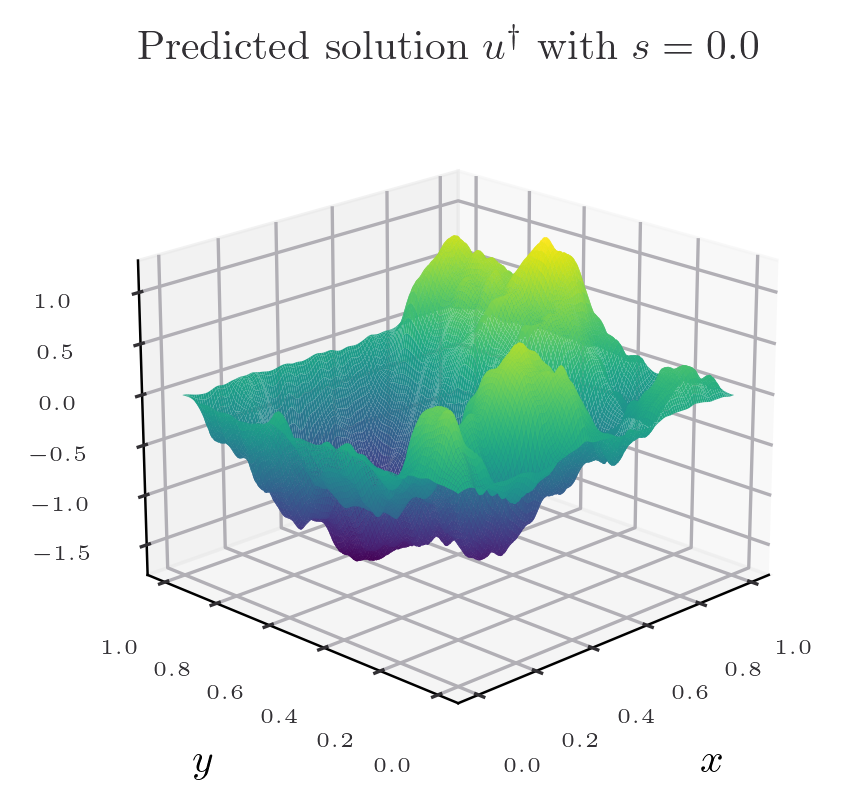

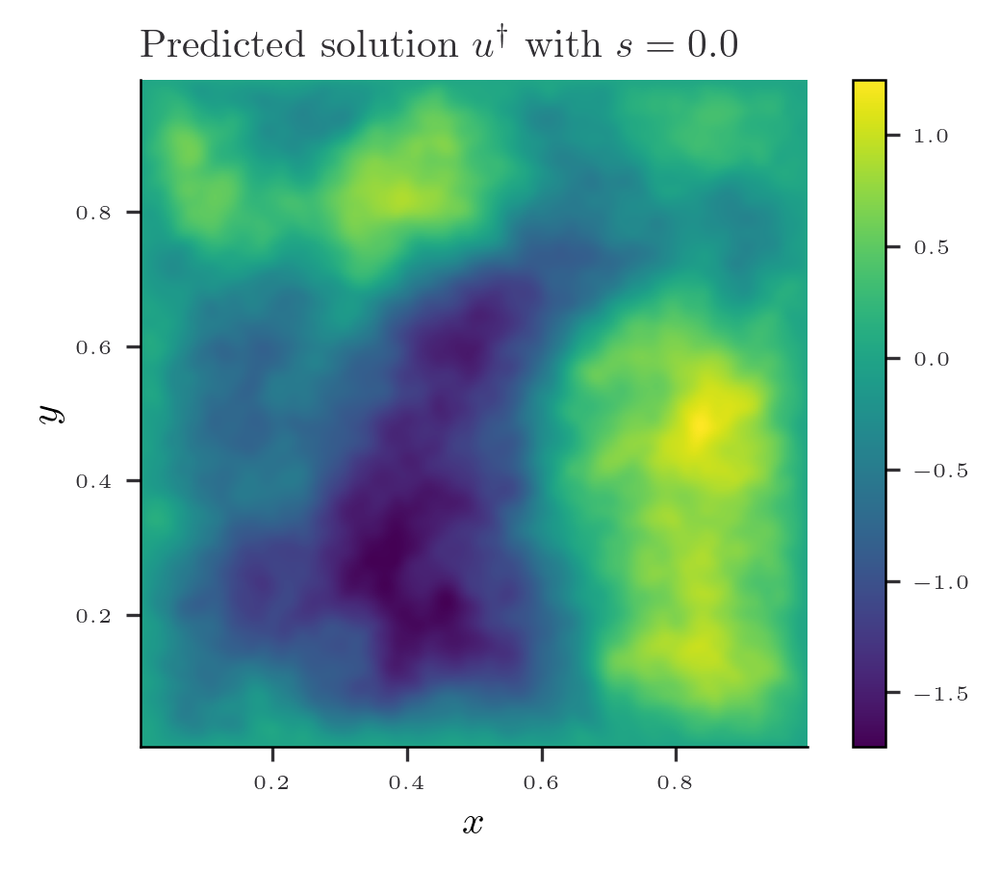

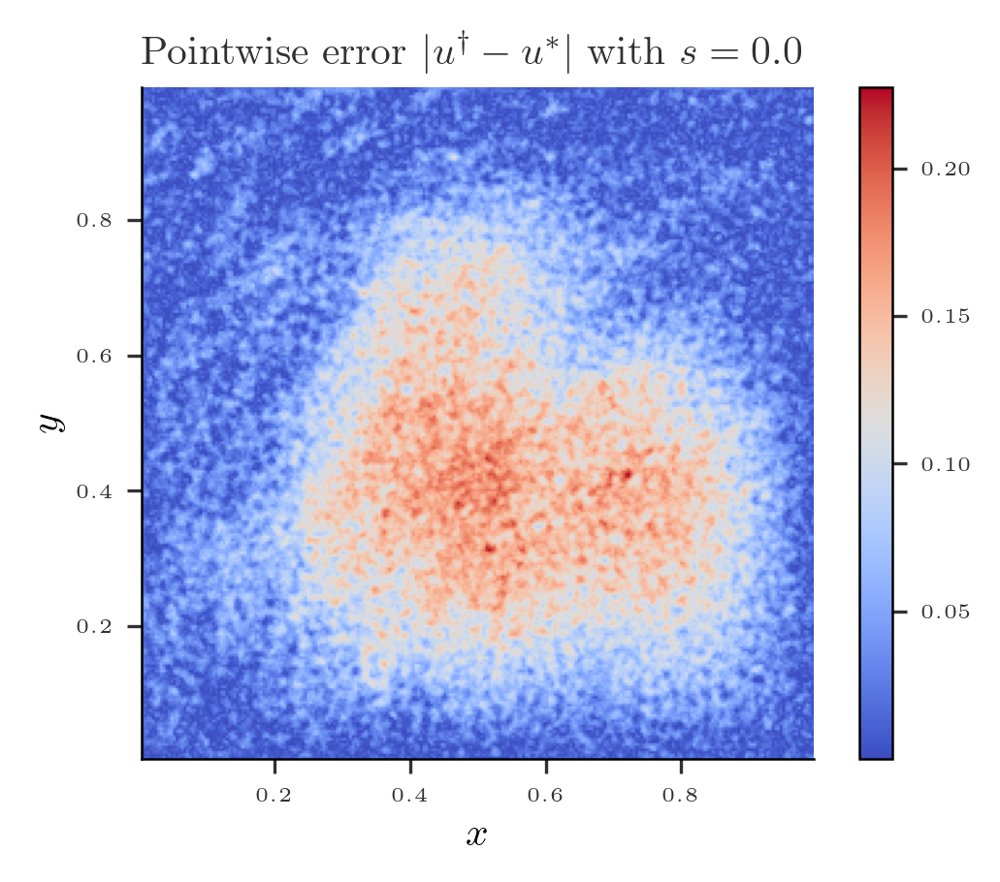

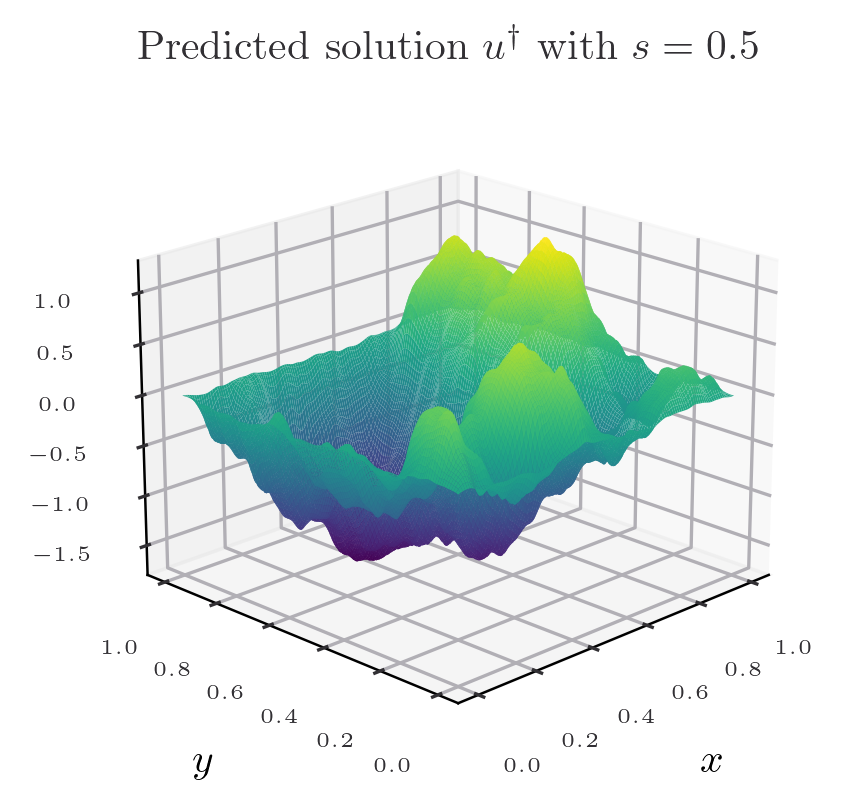

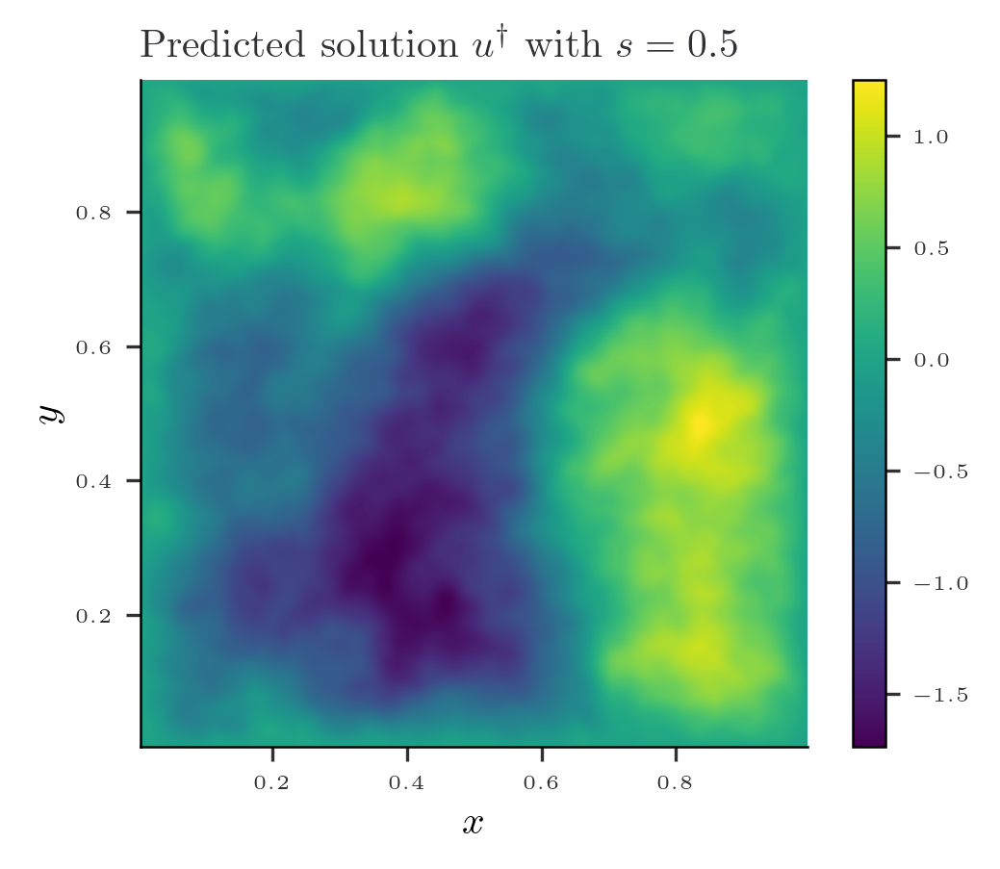

...

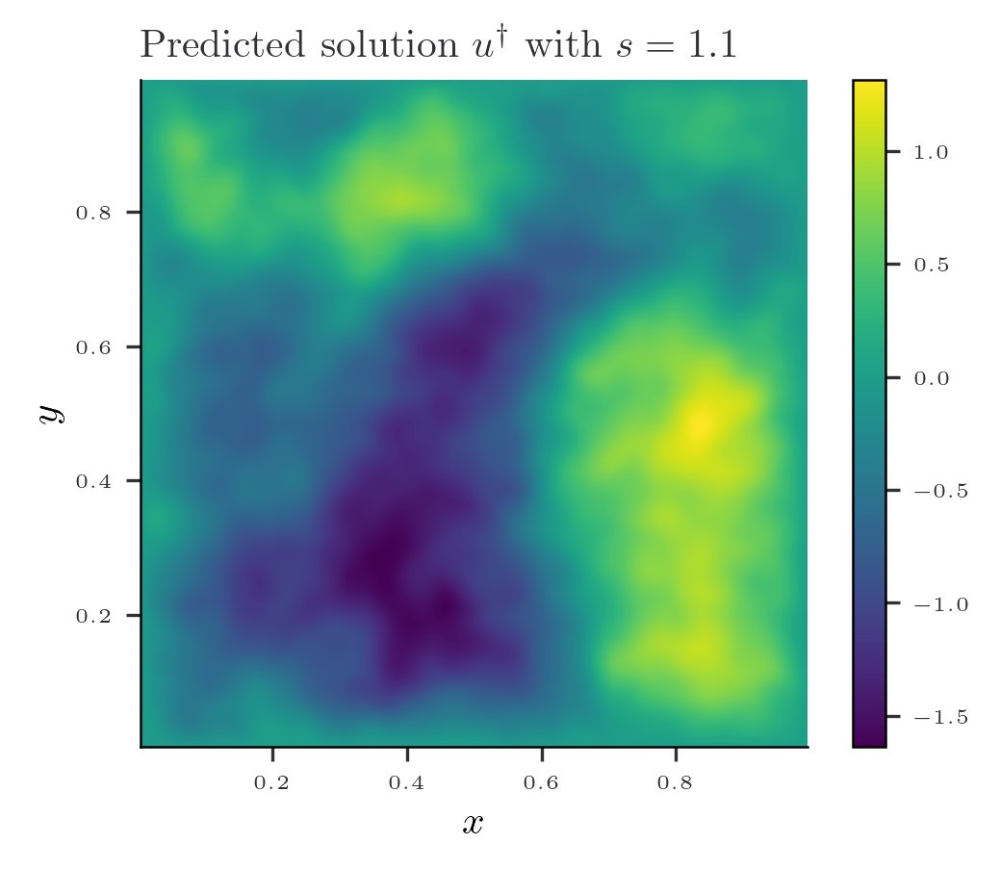

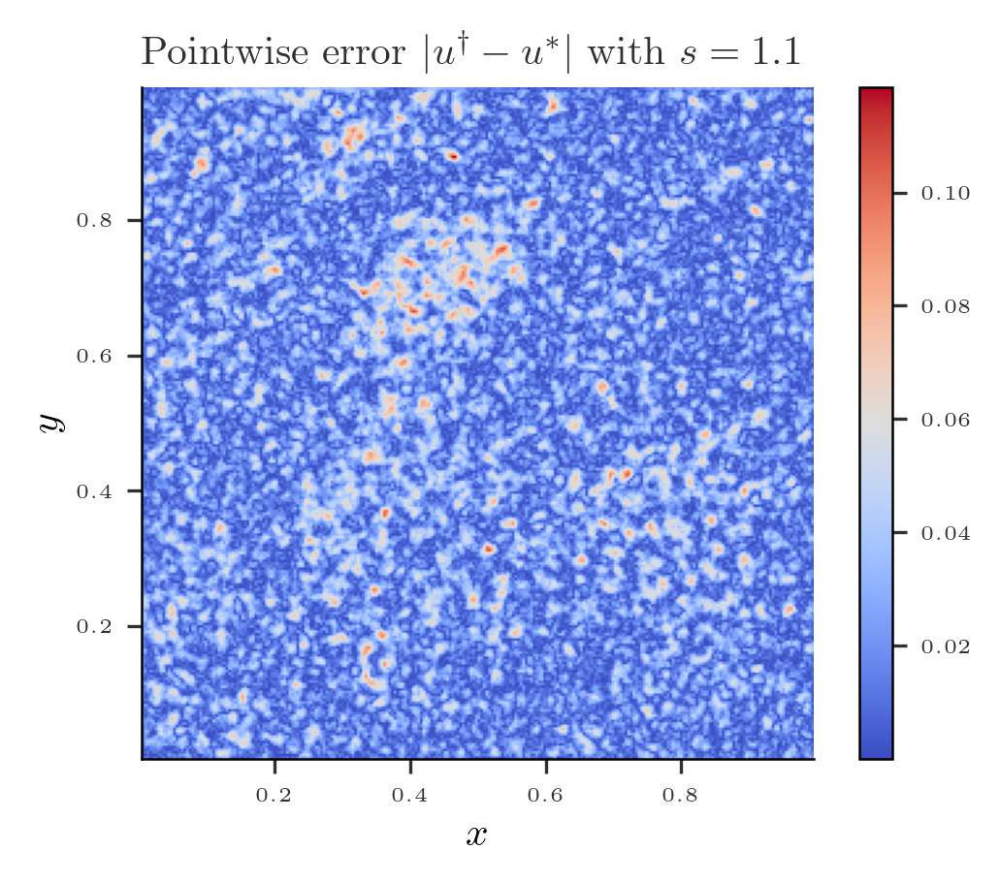

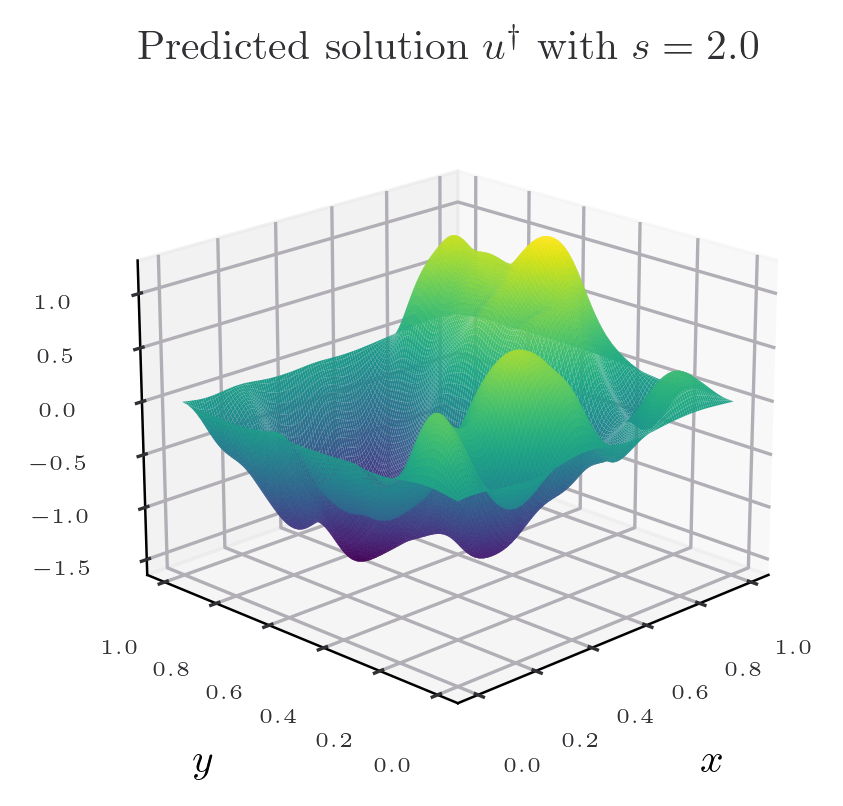

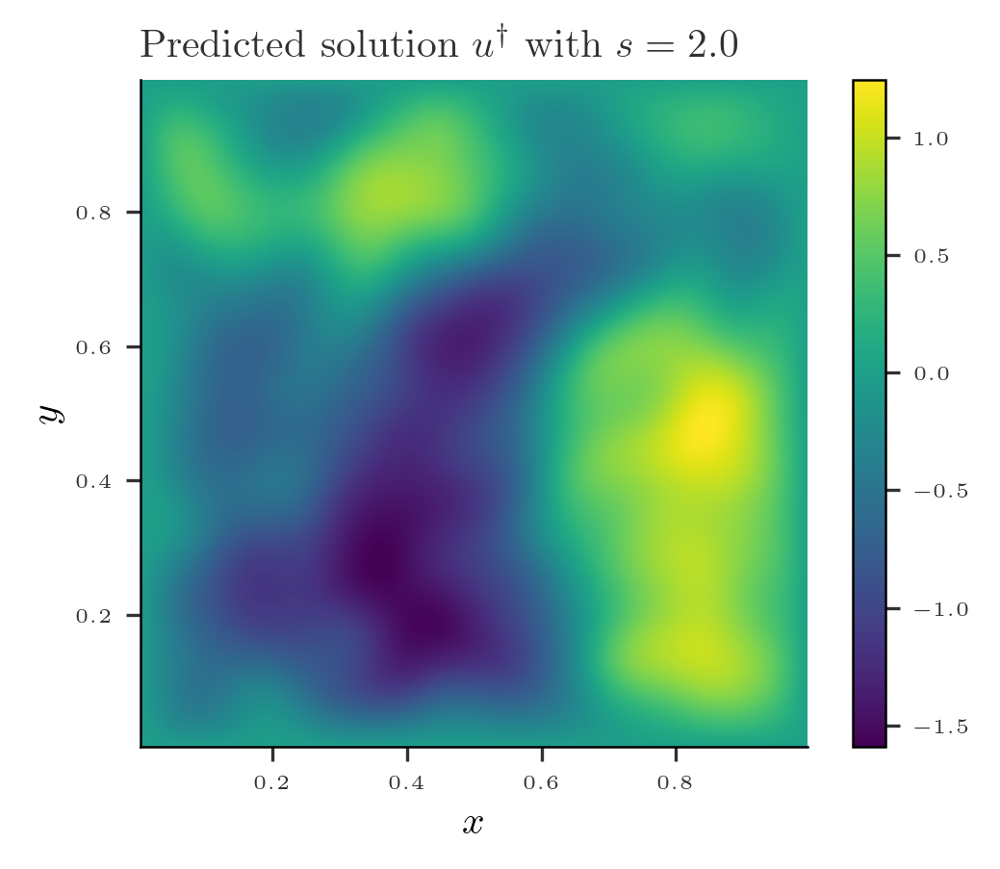

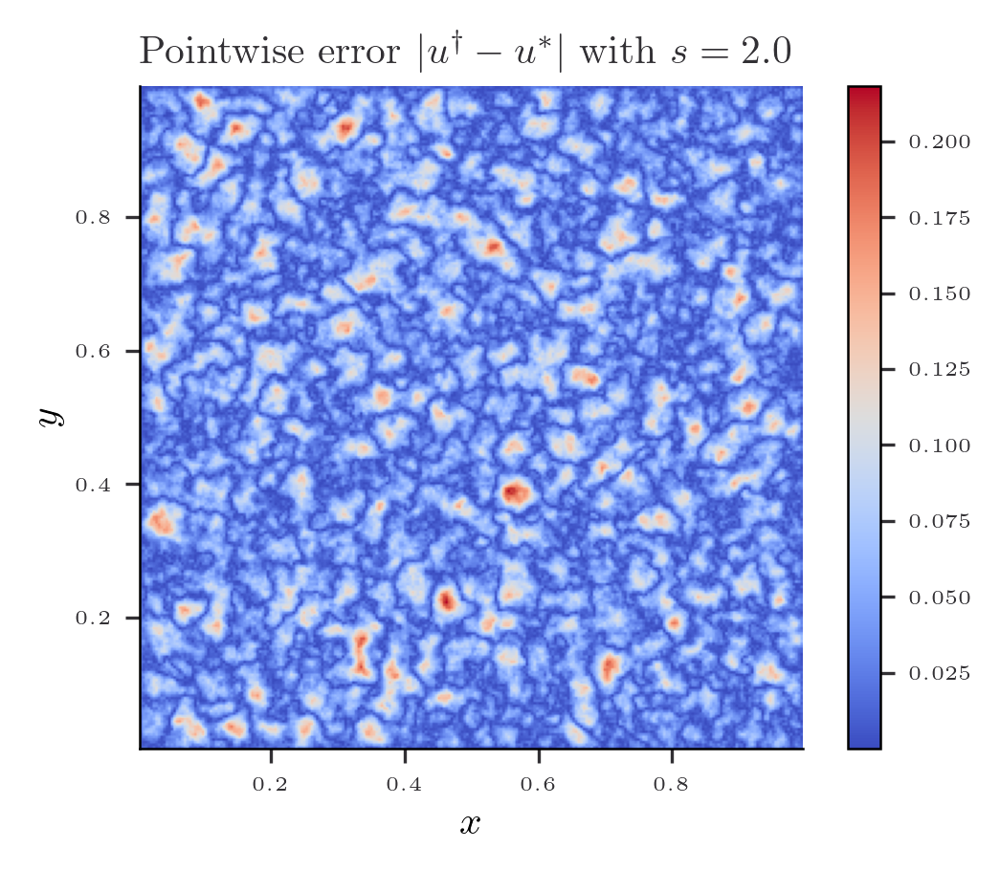

In [ ]:
for pred_grid, s in zip(predictions, s_values):
    create_plots(pred_grid, s)

## Plotting the loss hist

In [20]:
def create_plots_loss(loss_values, s):
    plt.plot(loss_hist)
    plt.yscale('log')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training loss withy $s = {}$'.format(s))
    plt.show()

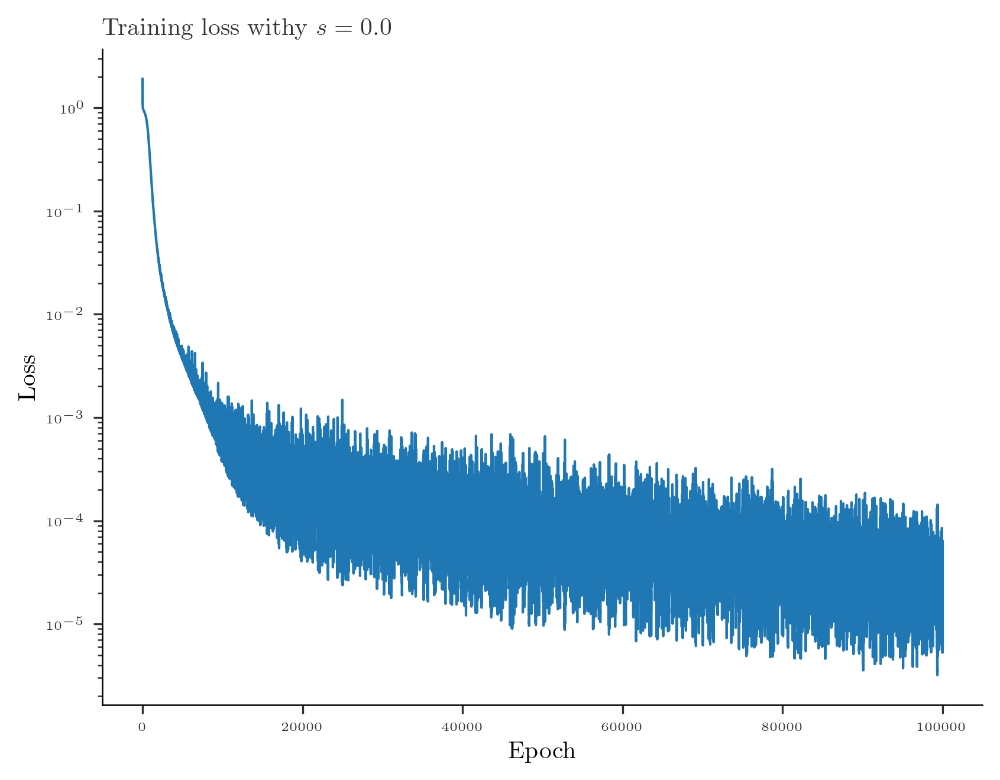

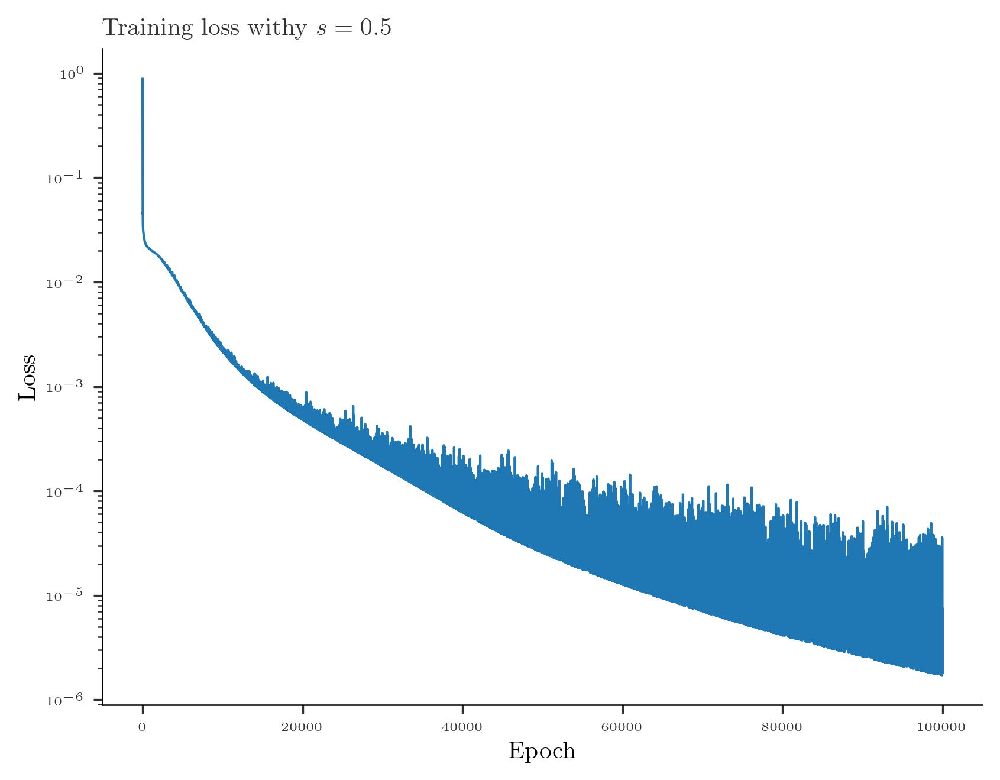

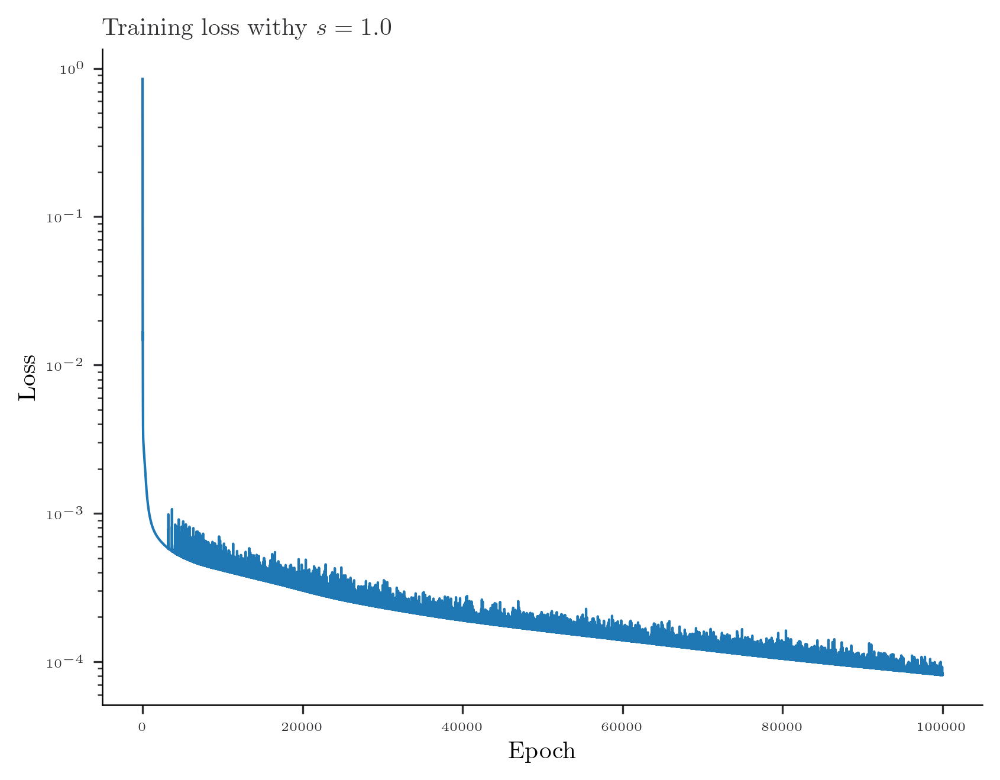

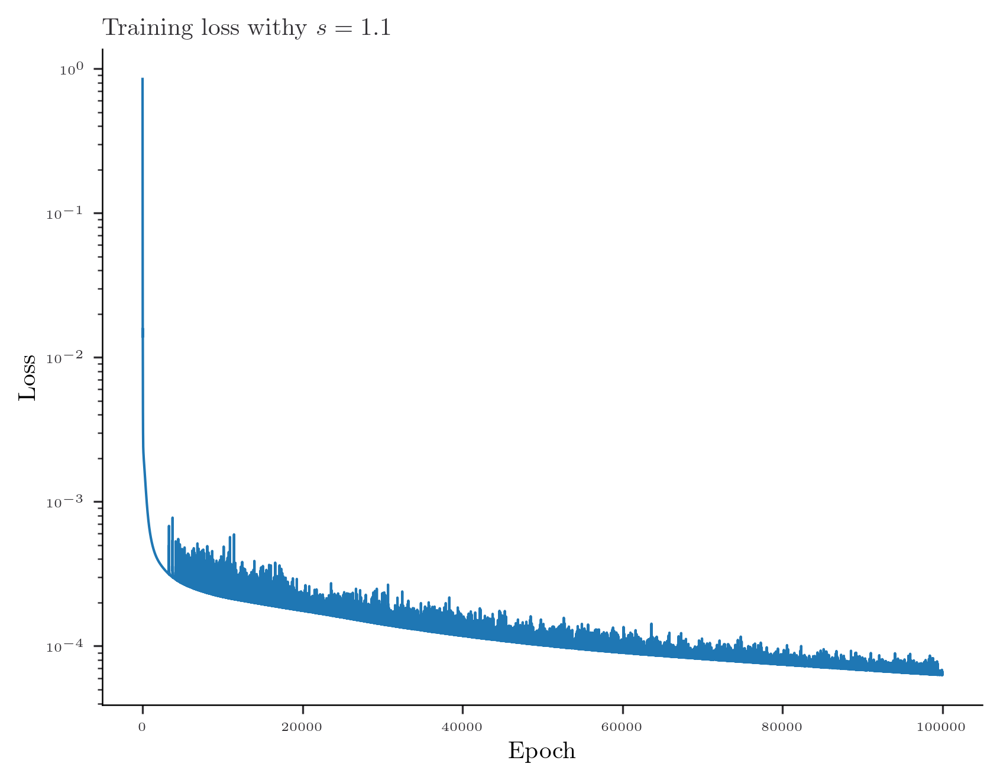

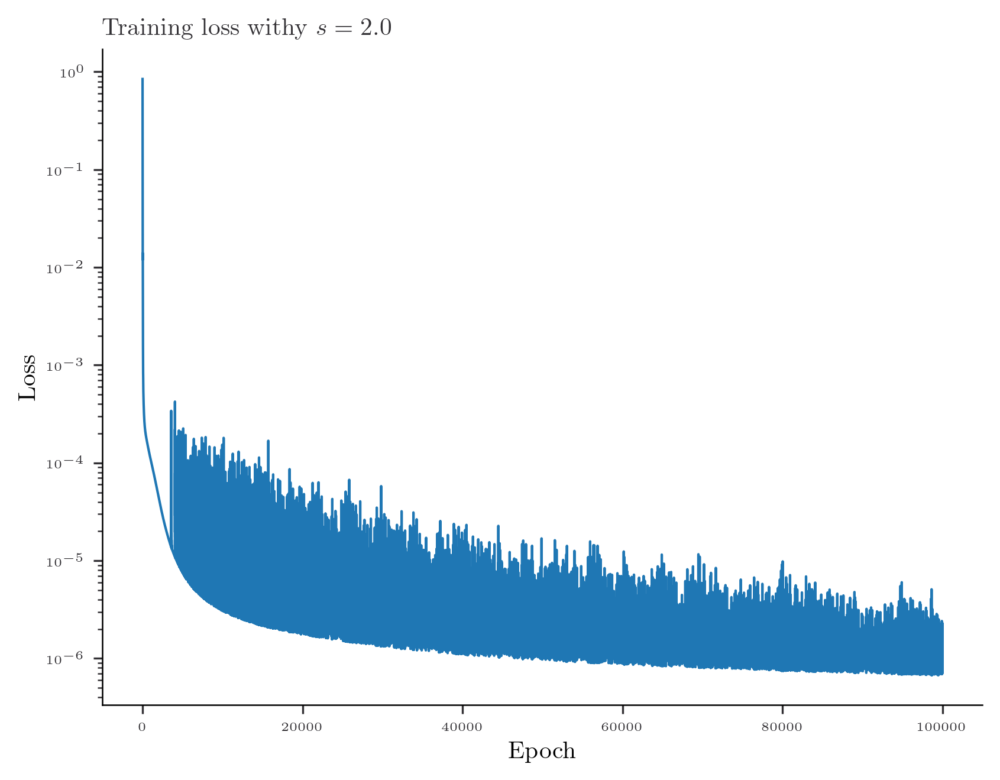

In [21]:
for loss_hist, s in zip(loss_values, s_values):
    create_plots_loss(loss_hist, s)